In [ ]:
pip install pingouin
pip install bioinfokit

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
import seaborn as sns
from IPython.display import display
import pingouin as pg
from scipy import stats
import scipy.stats as stats
from bioinfokit.analys import stat, get_data
import sklearn
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis 
from sklearn import datasets
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [4]:
df = pd.read_csv('Wellbeing_and_lifestyle_data_Kaggle.csv')
df.head()

,Timestamp,FRUITS_VEGGIES,DAILY_STRESS,PLACES_VISITED,CORE_CIRCLE,SUPPORTING_OTHERS,SOCIAL_NETWORK,ACHIEVEMENT,DONATION,BMI_RANGE,...,SLEEP_HOURS,LOST_VACATION,DAILY_SHOUTING,SUFFICIENT_INCOME,PERSONAL_AWARDS,TIME_FOR_PASSION,WEEKLY_MEDITATION,AGE,GENDER,WORK_LIFE_BALANCE_SCORE
0,7/7/15,3,2,2,5,0,5,2,0,1,...,7,5,5,1,4,0,5,36 to 50,Female,609.5
1,7/7/15,2,3,4,3,8,10,5,2,2,...,8,2,2,2,3,2,6,36 to 50,Female,655.6
2,7/7/15,2,3,3,4,4,10,3,2,2,...,8,10,2,2,4,8,3,36 to 50,Female,631.6
3,7/7/15,3,3,10,3,10,7,2,5,2,...,5,7,5,1,5,2,0,51 or more,Female,622.7
4,7/7/15,5,1,3,3,10,4,2,4,2,...,7,0,0,2,8,1,5,51 or more,Female,663.9


# Data Cleaning

In [5]:
df = df.loc[:,['DAILY_STRESS', 'PLACES_VISITED', 'SOCIAL_NETWORK', 'SLEEP_HOURS', 'ACHIEVEMENT', 'GENDER']]

cleanup_nums = {"GENDER": {"Female": 0, "Male": 1}}
df = df.replace(cleanup_nums)
display(df.isnull().sum())
df = df.drop(10005, axis=0, errors='ignore').apply(pd.to_numeric)
pd.set_option('display.max_columns', None)
df

DAILY_STRESS      0
PLACES_VISITED    0
SOCIAL_NETWORK    0
SLEEP_HOURS       0
ACHIEVEMENT       0
GENDER            0
dtype: int64

,DAILY_STRESS,PLACES_VISITED,SOCIAL_NETWORK,SLEEP_HOURS,ACHIEVEMENT,GENDER
0,2,2,5,7,2,0
1,3,4,10,8,5,0
2,3,3,10,8,3,0
3,3,10,7,5,2,0
4,1,3,4,7,2,0
...,...,...,...,...,...,...
15967,3,0,10,7,0,0
15968,3,6,4,6,6,0
15969,3,0,8,7,6,1
15970,1,10,7,8,3,0


In [6]:
df['DAILY_STRESS'] = df['DAILY_STRESS'].astype('category')
df['GENDER'] = df['GENDER'].astype('category')
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 15971 entries, 0 to 15971
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   DAILY_STRESS    15971 non-null  category
 1   PLACES_VISITED  15971 non-null  int64   
 2   SOCIAL_NETWORK  15971 non-null  int64   
 3   SLEEP_HOURS     15971 non-null  int64   
 4   ACHIEVEMENT     15971 non-null  int64   
 5   GENDER          15971 non-null  category
dtypes: category(2), int64(4)
memory usage: 655.4 KB


# Descriptive Statistics Analysis

In [7]:
df.describe()

,PLACES_VISITED,SOCIAL_NETWORK,SLEEP_HOURS,ACHIEVEMENT
count,15971.000000,15971.000000,15971.000000,15971.000000
mean,5.233235,6.474047,7.042953,4.000689
std,3.311847,3.086643,1.199053,2.755912
min,0.000000,0.000000,1.000000,0.000000
25%,2.000000,4.000000,6.000000,2.000000
50%,5.000000,6.000000,7.000000,3.000000
75%,8.000000,10.000000,8.000000,6.000000
max,10.000000,10.000000,10.000000,10.000000


### Outliers Check: Boxplot for All Numeric Independent Variables

Text(0.5, 1.0, 'Figure 2: Boxplot For Numerical Explanatory Variables')

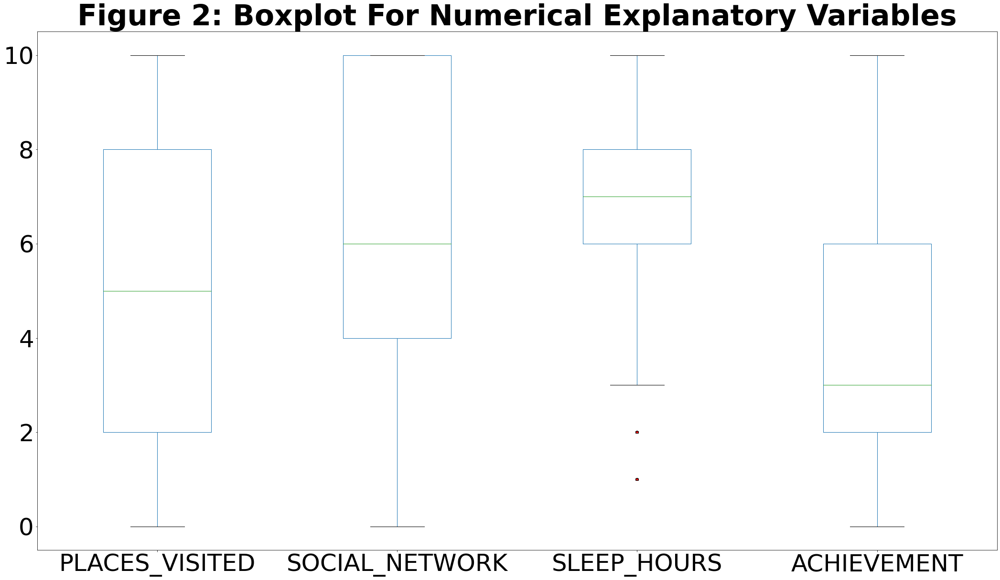

In [8]:

bit = dict(markerfacecolor = 'r', marker='p')
boxplot = df.boxplot(figsize=(36,20), grid=False, flierprops=bit, fontsize=50)
# sns.boxplot(data = df)

plt.title('Figure 2: Boxplot For Numerical Explanatory Variables', fontsize=60, fontweight='bold')



### Histogram for All Numeric Independent Variables

Text(0.5, 0.98, 'Figure 3: Histogram Plots for All Numeric Variables')

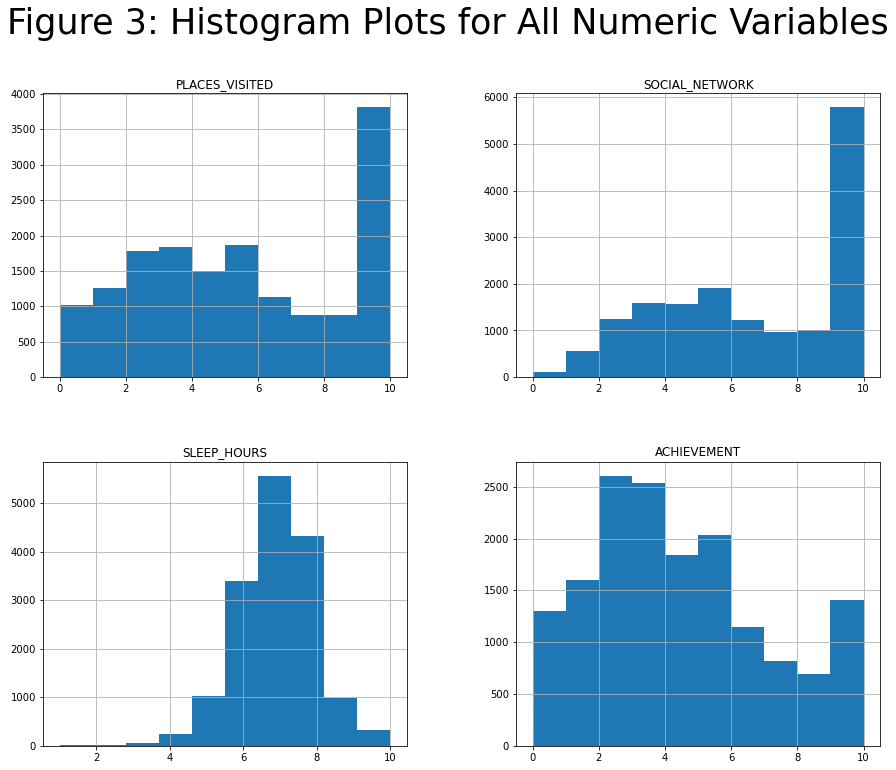

In [9]:
df.iloc[:,1:].hist(layout=(2,2), figsize=(15,12), grid=True)
plt.suptitle("Figure 3: Histogram Plots for All Numeric Variables", fontsize=35)


### Normality Check

In [10]:
alpha = 0.05
d = {'stats.normaltest':[], 'stats.shapiro': []}
labels = []

for i in df.columns:
    s1, pvalue1 = stats.normaltest(df[[i]])
    s2, pvalue2 = stats.shapiro(df[[i]])
    d['stats.normaltest'].append(pvalue1[0])
    d['stats.shapiro'].append(pvalue2)
    labels.append(i)
    
    print("Column:", i)
    
    print("stats.normaltest test statistic", s1, "p-value", pvalue1)
    if pvalue1 < alpha:
        print("The null hypothesis can be rejcted")
    else:
        print("The null hypothesis cannot be rejected")
        
    print()    
    print("Shapiro test statistic", s2, "p-value", pvalue2)
    if pvalue2 < alpha:
        print("The null hypothesis can be rejcted")
    else:
        print("The null hypothesis cannot be rejected")
print()


normaldf1 = pd.DataFrame(d, index=labels)
display(normaldf1)
print()

    

Column: DAILY_STRESS
stats.normaltest test statistic [1362.03212854] p-value [1.73173407e-296]
The null hypothesis can be rejcted

Shapiro test statistic 0.9335169196128845 p-value 0.0
The null hypothesis can be rejcted
Column: PLACES_VISITED
stats.normaltest test statistic [24792.50107511] p-value [0.]
The null hypothesis can be rejcted

Shapiro test statistic 0.9095180630683899 p-value 0.0
The null hypothesis can be rejcted
Column: SOCIAL_NETWORK
stats.normaltest test statistic [204247.66985104] p-value [0.]
The null hypothesis can be rejcted

Shapiro test statistic 0.8759161829948425 p-value 0.0
The null hypothesis can be rejcted
Column: SLEEP_HOURS
stats.normaltest test statistic [703.04518682] p-value [2.16609459e-153]
The null hypothesis can be rejcted

Shapiro test statistic 0.9284169673919678 p-value 0.0
The null hypothesis can be rejcted
Column: ACHIEVEMENT
stats.normaltest test statistic [1019.20473505] p-value [4.81397488e-222]
The null hypothesis can be rejcted

Shapiro tes

/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


,stats.normaltest,stats.shapiro
DAILY_STRESS,1.731734e-296,0.0
PLACES_VISITED,0.000000e+00,0.0
SOCIAL_NETWORK,0.000000e+00,0.0
SLEEP_HOURS,2.166095e-153,0.0
ACHIEVEMENT,4.813975e-222,0.0
GENDER,0.000000e+00,0.0


### Correlation Test

Text(0.5, 0.98, 'Figure 5: Correlation Matrix')

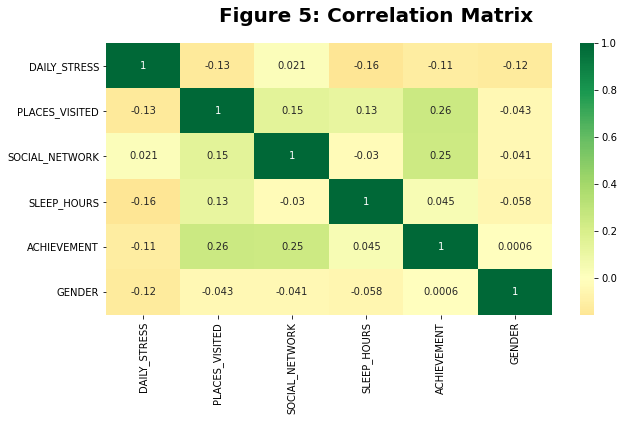

In [14]:
df['DAILY_STRESS'] = df['DAILY_STRESS'].astype('int64')
df['GENDER'] = df['GENDER'].astype('int64')
plt.figure(figsize=(10,5))
p=sns.heatmap(df.corr(), annot=True,cmap='RdYlGn',center=0) 
plt.suptitle('Figure 5: Correlation Matrix', fontweight = 'bold', fontsize=20)

In [15]:
df['DAILY_STRESS'] = df['DAILY_STRESS'].astype('category')
df['GENDER'] = df['GENDER'].astype('category')

# Inferential Statistic Analysis
## One-Way ANOVA Test

#### Independent Variable 1: Places Visited

H0: μ0 = μ1 = μ2 = … = μ5, the mean places visited is the same across all survey respondents with stress level ranging from 0 to 5

H1: at least one population mean is different from the others

In [16]:
variable1_G0 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==0)]
variable1_G1 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==1)]
variable1_G2 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==2)]
variable1_G3 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==3)]
variable1_G4 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==4)]
variable1_G5 = df[['DAILY_STRESS', 'PLACES_VISITED']].loc[(df['DAILY_STRESS']==5)]


In [17]:
stat1, p1 = f_oneway(variable1_G0['PLACES_VISITED'],
                     variable1_G1['PLACES_VISITED'],
                     variable1_G2['PLACES_VISITED'],
                     variable1_G3['PLACES_VISITED'],
                     variable1_G4['PLACES_VISITED'],
                     variable1_G5['PLACES_VISITED'])

In [18]:
print("p-values:", p1)
print("ANOVA:", stat1)

if p1 < 0.05:
    print("We reject the null hypothesis")
else:
    print("We do not reject the null hypothesis")

p-values: 2.5014735138376546e-71
ANOVA: 68.72046510457366
We reject the null hypothesis


#### Independent Variable 2: Social Network

H0: μ0 = μ1 = μ2 = … = μ5, the mean number of people interacted per day is the same across all survey respondents with stress level ranging from 0 to 5

H1: at least one population mean is different from the others

In [19]:
variable2_G0 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==0)]
variable2_G1 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==1)]
variable2_G2 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==2)]
variable2_G3 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==3)]
variable2_G4 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==4)]
variable2_G5 = df[['DAILY_STRESS', 'SOCIAL_NETWORK']].loc[(df['DAILY_STRESS']==5)]

In [20]:
stat2, p2 = f_oneway(variable2_G0['SOCIAL_NETWORK'],
                   variable2_G1['SOCIAL_NETWORK'],
                   variable2_G2['SOCIAL_NETWORK'],
                   variable2_G3['SOCIAL_NETWORK'],
                   variable2_G4['SOCIAL_NETWORK'],
                   variable2_G5['SOCIAL_NETWORK'])

In [21]:
print("p-values:", p2)
print("ANOVA:", stat2)

if p2 < 0.05:
    print("We reject the null hypothesis")
else:
    print("We do not reject the null hypothesis")

p-values: 1.7410140092174364e-08
ANOVA: 8.9337277247156
We reject the null hypothesis


#### Independent Variable 3: Sleep Hours

H0: μ0 = μ1 = μ2 = … = μ5, the mean number of hours slept per night is the same across all survey respondents with stress level ranging from 0 to 5

H1: at least one population mean is different from the others

In [22]:
variable3_G0 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==0)]
variable3_G1 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==1)]
variable3_G2 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==2)]
variable3_G3 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==3)]
variable3_G4 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==4)]
variable3_G5 = df[['DAILY_STRESS', 'SLEEP_HOURS']].loc[(df['DAILY_STRESS']==5)]

In [23]:
stat3, p3 = f_oneway(variable3_G0['SLEEP_HOURS'],
                     variable3_G1['SLEEP_HOURS'],
                     variable3_G2['SLEEP_HOURS'],
                     variable3_G3['SLEEP_HOURS'],
                     variable3_G4['SLEEP_HOURS'],
                     variable3_G5['SLEEP_HOURS'])

In [24]:
print("p-values:", p3)
print("ANOVA:", stat3)

if p3 < 0.05:
    print("We reject the null hypothesis")
else:
    print("We do not reject the null hypothesis")

p-values: 2.352836942520589e-84
ANOVA: 81.09870793501278
We reject the null hypothesis


#### Independent Variable 4: Personal Achievement

H0: μ0 = μ1 = μ2 = … = μ5, the mean number of recognition received is the same across all survey respondents with stress level ranging from 0 to 5

H1: at least one population mean is different from the others

In [25]:
variable4_G0 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==0)]
variable4_G1 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==1)]
variable4_G2 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==2)]
variable4_G3 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==3)]
variable4_G4 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==4)]
variable4_G5 = df[['DAILY_STRESS', 'ACHIEVEMENT']].loc[(df['DAILY_STRESS']==5)]

In [26]:
stat4, p4 = f_oneway(variable4_G0['ACHIEVEMENT'],
                     variable4_G1['ACHIEVEMENT'],
                     variable4_G2['ACHIEVEMENT'],
                     variable4_G3['ACHIEVEMENT'],
                     variable4_G4['ACHIEVEMENT'],
                     variable4_G5['ACHIEVEMENT'])

In [27]:
print("p-values:", p4)
print("ANOVA:", stat4)

if p4 < 0.05:
    print("We reject the null hypothesis")
else:
    print("We do not reject the null hypothesis")

p-values: 5.289593374298726e-47
ANOVA: 45.67145572016908
We reject the null hypothesis


### OLS

In [28]:
import statsmodels.api as sm 
from statsmodels.sandbox.regression.predstd import wls_prediction_std

In [29]:
feature_cols = ['SOCIAL_NETWORK', 'ACHIEVEMENT','PLACES_VISITED','SLEEP_HOURS','GENDER']
X = df[feature_cols] # Features
y = df['DAILY_STRESS'] # Target variable

# Fit and summarize OLS model
mod = sm.OLS(y,X)
res = mod.fit()

print(res.summary())

                                 OLS Regression Results                                
Dep. Variable:           DAILY_STRESS   R-squared (uncentered):                   0.773
Model:                            OLS   Adj. R-squared (uncentered):              0.773
Method:                 Least Squares   F-statistic:                          1.085e+04
Date:                Fri, 10 Dec 2021   Prob (F-statistic):                        0.00
Time:                        01:44:38   Log-Likelihood:                         -28949.
No. Observations:               15971   AIC:                                  5.791e+04
Df Residuals:                   15966   BIC:                                  5.795e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

In [30]:
print('R2: ', res.rsquared)

R2:  0.7726138992248028


# Inferential Statistics - Prediction
## Decision Tree & Regression Tree Model

In [32]:
!pip install graphviz
!dot -Tpng tree.dot -o tree.png
!pip install opencv-python
!pip install pydotplus
!pip install pydot

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.110509 to fit


In [31]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics

# build a dictionary to record all evaluations for all models
model_evaluation = {}
feature_importances_df = {}

In [32]:
feature_cols = ['SOCIAL_NETWORK', 'ACHIEVEMENT','PLACES_VISITED','SLEEP_HOURS','GENDER']
X = df[feature_cols] # Features
y = df['DAILY_STRESS'] # Target variable

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)


### Regression Tree for Prediction

In [146]:

# create a regressor object
dtr = DecisionTreeRegressor(random_state = 0)
# fit the regressor with X and Y data
dtr.fit(X_train,y_train)
#
y_pred = dtr.predict(X_test)

from sklearn import metrics

mae = metrics.mean_absolute_error(y_test, y_pred)
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))
print()
# rounding values in y_pred into the nearest int
round_y_pred = np.array([round(x) for x in y_pred])
print("Accuracy for Full Regression Tree: %.3f" % (100 * metrics.accuracy_score(y_test, round_y_pred)))

model_evaluation['Full Regression Tree'] = [mae, mse, rmse, 100 * metrics.accuracy_score(y_test, round_y_pred)]




Mean Absolute Error: 1.237
Mean Squared Error: 2.555
Root Mean Squared Error: 1.598

Accuracy for Full Regression Tree: 27.480


#### Hyper Parameter tuning

Text(0.5, 0.98, 'Figure 7: max_depth V.S. errors for Regression Tree')

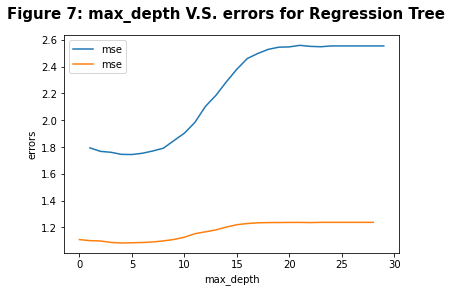

In [285]:
max_depth = []
mse = []
mae = []
for i in range(1,30):
    dtree = DecisionTreeRegressor(max_depth=i, random_state = 0)
    dtree.fit(X_train,y_train)
    pred = dtree.predict(X_test)
    mse.append(metrics.mean_squared_error(y_test, pred))
    mae.append(metrics.mean_absolute_error(y_test, pred))
    max_depth.append(i)

d = pd.DataFrame({'mse':pd.Series(mse), 'mae':pd.Series(mae), 'max_depth':pd.Series(max_depth)})
# visualizing changes in parameters
plt.plot('max_depth','mse', 'mae', data=d)
plt.xlabel('max_depth')
plt.ylabel('errors')
plt.legend()
plt.suptitle('Figure 7: max_depth V.S. errors for Regression Tree', fontweight='bold', fontsize = 15)



In [286]:

print("max_depth to minimize mse:", max_depth[mse.index(min(mse))])
print("max_depth to minimize mae:", max_depth[mae.index(min(mae))])


max_depth to minimize mse: 5
max_depth to minimize mae: 5


In [116]:
parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]}

from sklearn.model_selection import GridSearchCV

tuning_model=GridSearchCV(dtr,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
tuning_model.fit(X_train,y_train)
# best hyperparameters 
print(tuning_model.best_params_)
print()
print("best neg mse:", tuning_model.best_score_)


Fitting 3 folds for each of 28000 candidates, totalling 84000 fits
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, m

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fracti

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fractio

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fract

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weig

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fract

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fractio

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fractio

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_l

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fract

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weig

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_l

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fracti

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fracti

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fractio

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fract

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weig

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_l

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fracti

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fract

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weigh

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weig

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weig

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_l

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fractio

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fract

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weig

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fractio

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fract

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fracti

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_wei

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, m

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fract

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fractio

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weig

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weig

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fractio

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weig

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weig

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weig

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weig

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_frac

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_frac

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_frac

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_le

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_le

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_le

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_le

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, m

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, m

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, m

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, m

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_f

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fr

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, m

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, m

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, m

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, m

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, m

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fr

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fr

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, m

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, m

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, m

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, m

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, m

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, m

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, m

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, m

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, m

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, m

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fr

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fr

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, m

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, m

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, m

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, m

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, m

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, m

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, m

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_f

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, m

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, m

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, m

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weig

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weig

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_frac

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_f

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_frac

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fr

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, m

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, m

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, m

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_lea

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weig

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_frac

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_frac

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_frac

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random; total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best; total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_frac

{'max_depth': 5, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}

best neg mse: -1.7791600463199793


#### Training Regression Tree With Best Hyperparameters

In [34]:
# create a regressor object
dtr2 = DecisionTreeRegressor(random_state = 0, max_depth=5, max_features='auto',
                            max_leaf_nodes = None, min_samples_leaf = 1,
                            min_weight_fraction_leaf = 0.1, splitter = 'best')
# fit the regressor with X and Y data
dtr2.fit(X_train,y_train)
#
y_pred2 = dtr2.predict(X_test)

from sklearn import metrics

mae = metrics.mean_absolute_error(y_test, y_pred2)
mse = metrics.mean_squared_error(y_test, y_pred2)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred2))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))
# rounding values in y_pred into the nearest int
round_y_pred2 = np.array([round(x) for x in y_pred2])
print("Accuracy for Pruned Regression Tree: %.3f" % (100 * metrics.accuracy_score(y_test, round_y_pred2)))

model_evaluation['Tuned Regression Tree'] = [mae, mse, rmse, 100 * metrics.accuracy_score(y_test, round_y_pred2)]



Mean Absolute Error: 1.094
Mean Squared Error: 1.749
Root Mean Squared Error: 1.323
Accuracy for Pruned Regression Tree: 28.451


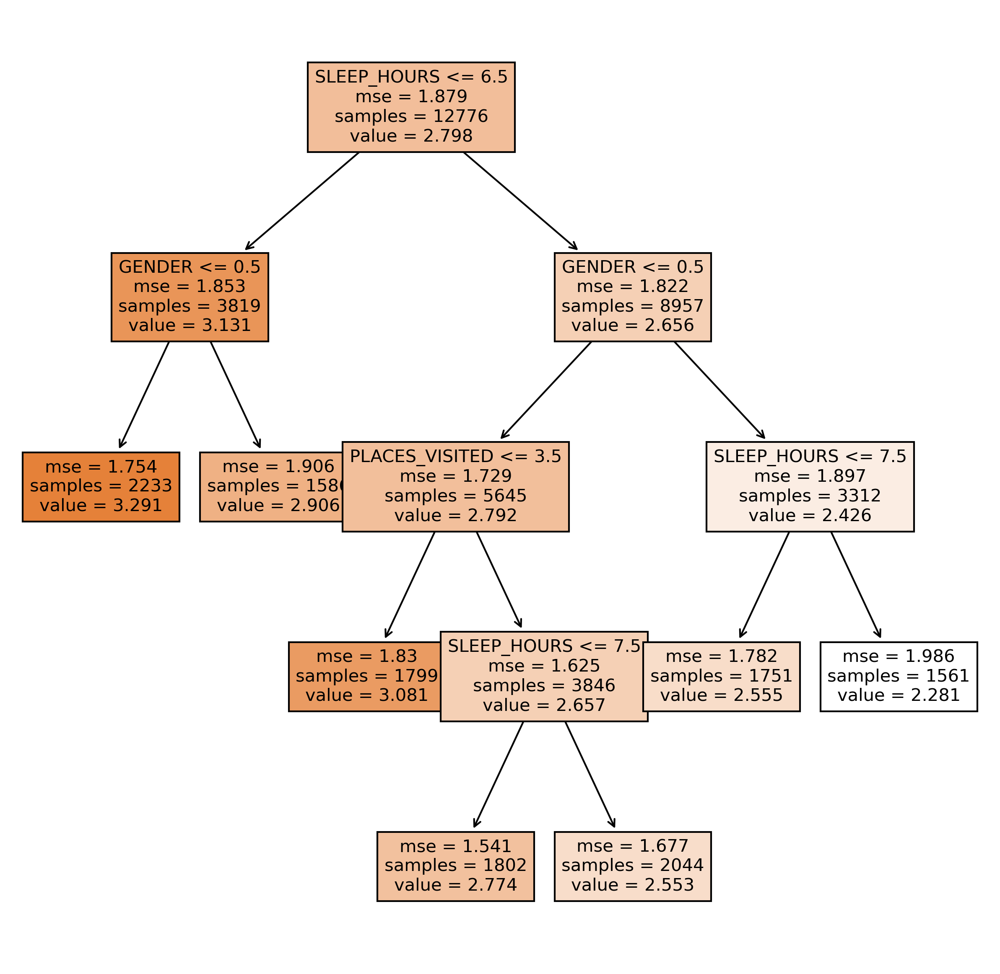

In [159]:
fig, ax = plt.subplots(nrows = 1,ncols = 1,dpi=300, figsize=(10, 10))
tree.plot_tree(dtr2, 
               feature_names=feature_cols, 
               class_names=['DAILY_STRESS = 0', 'DAILY_STRESS = 1', 'DAILY_STRESS = 2', 'DAILY_STRESS = 3', 'DAILY_STRESS = 4', 'DAILY_STRESS = 5'], 
               filled=True,
               fontsize=10)
fig.savefig('imagename.png')
plt.show()

SOCIAL_NETWORK    0.000000
ACHIEVEMENT       0.000000
PLACES_VISITED    0.163379
SLEEP_HOURS       0.527870
GENDER            0.308751
dtype: float64

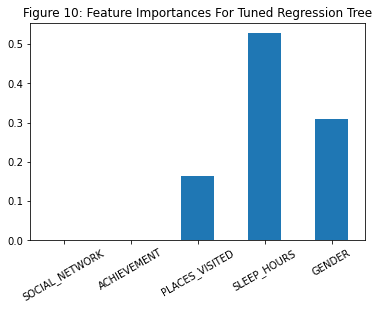

In [37]:
importance = pd.Series(dtr2.feature_importances_, index=feature_cols)
importance.plot(kind='bar', title='Figure 10: Feature Importances For Tuned Regression Tree', rot = 30)

display(importance)
feature_importances_df['Pruned Regression Tree'] = list(dtr2.feature_importances_)


## Bagging

In [42]:
from sklearn.ensemble import BaggingRegressor

br1 = BaggingRegressor(random_state=0, base_estimator = dtr2)
br1.fit(X_train, y_train)

y_pred3 = br1.predict(X_test)

from sklearn import metrics

mae = metrics.mean_absolute_error(y_test, y_pred3)
mse = metrics.mean_squared_error(y_test, y_pred3)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred3))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))

# rounding values in y_pred into the nearest int
round_y_pred3 = np.array([round(x) for x in y_pred3])
accuracy = 100 * metrics.accuracy_score(y_test, round_y_pred3)
print("Accuracy for Bagging: %.3f" % (accuracy))

model_evaluation['Bagging'] = [mae, mse, rmse, accuracy]



Mean Absolute Error: 1.087
Mean Squared Error: 1.742
Root Mean Squared Error: 1.320
Accuracy for Bagging: 28.451


#### Model Tuning

In [175]:

parameters={"n_estimators":[1,10,20,30,40,50,60,70,80,90,100],
            "max_features":[1, 2, 3, 4, 5],
            "warm_start":[True,False],
            "bootstrap": [True, False],
            "bootstrap_features": [True, False]}

from sklearn.model_selection import GridSearchCV

tuning_bagging=GridSearchCV(estimator = br1,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
tuning_bagging.fit(X_train,y_train)
# best hyperparameters 
print(tuning_bagging.best_params_)
print()
print("best neg mse:", tuning_bagging.best_score_)



Fitting 3 folds for each of 440 candidates, totalling 1320 fits
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=True; total time=   0.0s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=True; total time=   0.0s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=True; total time=   0.0s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=False; total time=   0.0s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=False; total time=   0.0s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=1, warm_start=False; total time=   0.0s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estimators=10, warm_start=True; total time=   0.0s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=1, n_estima

[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=True; total time=   0.0s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=True; total time=   0.0s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=False; total time=   0.0s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=False; total time=   0.0s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=20, warm_start=False; total time=   0.0s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=30, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=2, n_estimators=30, warm_start=True; total time=   0.1s
[CV 3/3] END 

[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=20, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=20, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=20, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=30, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=30, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=30, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=30, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=3, n_estimators=30, warm_start=False; total time=   0.1s
[CV 3/3] EN

[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=30, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=4, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END 

[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=30, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=30, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=30, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=30, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END

[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=30, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=30, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV

[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=30, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 

[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=30, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 

[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3

[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=True, bootstrap_features=False, max_features=5, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3

[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=1, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3

[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=40, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=2, n_estimators=50, warm_start=False; total time=   0.1s
[CV 

[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=50, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=3, n_estimators=50, warm_start=False; total time=   0.1s
[CV

[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=True; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=True; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=False; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=False; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=4, n_estimators=50, warm_start=False; total time=   0.1s
[CV

[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=True; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=True; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=True; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=True, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV

[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=40, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=50, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=1, n_estimators=60, warm_start=True; total time=   0

[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=50, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=60, warm_start=True; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=2, n_estimators=60, warm_start=True; total time=   0.

[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=True; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=False; total time=   0.1s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=50, warm_start=False; total time=   0.1s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=60, warm_start=True; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=60, warm_start=True; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=3, n_estimators=60, warm_start=True; total time=   0.

[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=True; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=False; total time=   0.1s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=False; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=50, warm_start=False; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=60, warm_start=True; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=60, warm_start=True; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=60, warm_start=True; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=4, n_estimators=60, warm_start=False; total time=   0

[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=50, warm_start=False; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=60, warm_start=True; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=60, warm_start=True; total time=   0.2s
[CV 3/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=60, warm_start=True; total time=   0.2s
[CV 1/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=60, warm_start=False; total time=   0.2s
[CV 2/3] END bootstrap=False, bootstrap_features=False, max_features=5, n_estimators=60, warm_start=False; total time=   

#### Tuned Bagging with Best Hyperparameter Combination

In [43]:
br2 = BaggingRegressor(random_state=0, base_estimator = dtr2, bootstrap = True,
                      bootstrap_features=False, max_features=4, n_estimators = 10,
                      warm_start = True)
br2.fit(X_train, y_train)

y_pred4 = br2.predict(X_test)

from sklearn import metrics

mae = metrics.mean_absolute_error(y_test, y_pred4)
mse = metrics.mean_squared_error(y_test, y_pred4)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred4))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))
# rounding values in y_pred into the nearest int
round_y_pred4 = np.array([round(x) for x in y_pred4])
print("Accuracy for Tuned Bagging: %.3f" % (100 * metrics.accuracy_score(y_test, round_y_pred4)))

model_evaluation['Tuned Bagging'] = [mae, mse, rmse, 100 * metrics.accuracy_score(y_test, round_y_pred4)]


Mean Absolute Error: 1.084
Mean Squared Error: 1.734
Root Mean Squared Error: 1.317
Accuracy for Tuned Bagging: 28.200


## Random Forest

In [44]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
import math

# create regressor object
rf = RandomForestRegressor(random_state = 0)

# fit the regressor with x and y data
rf.fit(X_train, y_train)
y_pred5 = rf.predict(X_test)

mae = metrics.mean_absolute_error(y_test, y_pred5)
mse = metrics.mean_squared_error(y_test, y_pred5)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred5))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))

# rounding values in y_pred into the nearest int
round_y_pred5 = np.array([round(x) for x in y_pred5])
accuracy = 100 * metrics.accuracy_score(y_test, round_y_pred5)
print("Accuracy for RF: %.3f" % (accuracy))

model_evaluation['Random Forest'] = [mae, mse, rmse, accuracy]



Mean Absolute Error: 1.142
Mean Squared Error: 2.038
Root Mean Squared Error: 1.427
Accuracy for RF: 28.263


#### Model Tuning

max_depth to minimize mse: 6
max_depth to minimize mae: 8


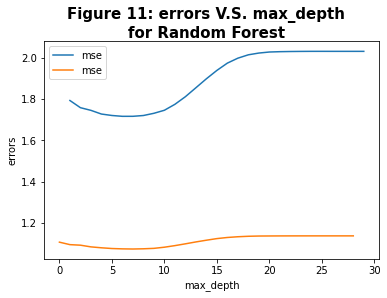

In [287]:
max_depth = []
mse = []
mae = []
for i in range(1,30):
    rf = RandomForestRegressor(max_depth=i, n_estimators = 500, random_state = 0)
    rf.fit(X_train,y_train)
    pred = rf.predict(X_test)
    mae.append(metrics.mean_absolute_error(y_test, pred))
    mse.append(metrics.mean_squared_error(y_test, pred))
    max_depth.append(i)

d = pd.DataFrame({'mse':pd.Series(mse), 
                  'mae':pd.Series(mae), 
                  'max_depth':pd.Series(max_depth)})
# visualizing changes in parameters
plt.plot('max_depth','mse', 'mae', data = d)
plt.xlabel('max_depth')
plt.ylabel('errors')
plt.suptitle('Figure 11: errors V.S. max_depth\nfor Random Forest', fontweight = 'bold', fontsize = 15, y = 1)
plt.legend() 

print("max_depth to minimize mse:", max_depth[mse.index(min(mse))])
print("max_depth to minimize mae:", max_depth[mae.index(min(mae))])




In [204]:
parameters={"n_estimators":[10,50,100,200,300,500,800,1000,1200],
            "max_depth" : [1,3,5,6,7,8,10,15,20,30],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "max_features":["auto","log2","sqrt",None],}

from sklearn.model_selection import GridSearchCV

tuning_rf=GridSearchCV(estimator = rf, param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
tuning_rf.fit(X_train,y_train)
# best hyperparameters 
print(tuning_rf.best_params_)
print()
print("best neg mse:", tuning_rf.best_score_)


Fitting 3 folds for each of 3600 candidates, totalling 10800 fits
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 1/3] END max_depth

[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=3, n_estimators=1200; total time=   1.8s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=6, n_estimators=1200; total time=   1.8s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=9, n_estimators=1200; total time=   1.8s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=auto, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=2, n_estimators=1200; total time=   1.6s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=5, n_estimators=1200; total time=   1.7s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=8, n_estimators=1200; total time=   1.7s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=log2, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=1, n_estimators=1200; total time=   1.6s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=4, n_estimators=1200; total time=   1.5s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=7, n_estimators=1200; total time=   1.6s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=sqrt, min_samples_leaf=10, n_estimators=1200; total time=   1.7s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=3, n_estimators=1200; total time=   1.8s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=6, n_estimators=1200; total time=   2.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=9, n_estimators=1200; total time=   2.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=1, max_features=None, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=2, n_estimators=1200; total time=   2.8s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=5, n_estimators=1200; total time=   2.8s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=8, n_estimators=1200; total time=   2.7s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=auto, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=1, n_estimators=1200; total time=   2.0s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=4, n_estimators=1200; total time=   1.9s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=7, n_estimators=1200; total time=   2.2s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=log2, min_samples_leaf=10, n_estimators=1200; total time=   2.2s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=3, n_estimators=1200; total time=   2.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=6, n_estimators=1200; total time=   2.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=9, n_estimators=1200; total time=   2.1s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=sqrt, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=2, n_estimators=1200; total time=   2.9s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=5, n_estimators=1200; total time=   3.3s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=8, n_estimators=1200; total time=   3.2s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=3, max_features=None, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=1, n_estimators=1200; total time=   3.8s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=4, n_estimators=1200; total time=   4.2s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=7, n_estimators=1200; total time=   3.7s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=auto, min_samples_leaf=10, n_estimators=1200; total time=   3.7s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=3, n_estimators=1200; total time=   2.4s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=6, n_estimators=1200; total time=   2.4s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=9, n_estimators=1200; total time=   2.4s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=log2, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=1200; total time=   2.6s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=5, n_estimators=1200; total time=   2.6s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=8, n_estimators=1200; total time=   3.3s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=sqrt, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=1, n_estimators=1200; total time=   4.1s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=4, n_estimators=1200; total time=   4.1s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=7, n_estimators=1200; total time=   4.0s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=5, max_features=None, min_samples_leaf=10, n_estimators=1200; total time=   4.0s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=3, n_estimators=1200; total time=   4.8s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=6, n_estimators=1200; total time=   4.3s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=9, n_estimators=1200; total time=   4.4s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=auto, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=2, n_estimators=1200; total time=   2.8s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=5, n_estimators=1200; total time=   2.9s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=8, n_estimators=1200; total time=   2.9s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=log2, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=1, n_estimators=1200; total time=   2.7s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=4, n_estimators=1200; total time=   2.8s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=7, n_estimators=1200; total time=   2.7s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=sqrt, min_samples_leaf=10, n_estimators=1200; total time=   2.6s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=3, n_estimators=1200; total time=   4.2s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=6, n_estimators=1200; total time=   4.4s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=9, n_estimators=1200; total time=   4.6s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=6, max_features=None, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=2, n_estimators=1200; total time=   4.5s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=5, n_estimators=1200; total time=   4.7s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=8, n_estimators=1200; total time=   4.6s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=7, max_features=auto, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=1, n_estimators=1200; total time=   3.2s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=4, n_estimators=1200; total time=   3.0s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=7, n_estimators=1200; total time=   3.3s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=log2, min_samples_leaf=10, n_estimators=1200; total time=   3.2s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=3, n_estimators=1200; total time=   2.9s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=6, n_estimators=1200; total time=   4.0s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=9, n_estimators=1200; total time=   3.9s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=sqrt, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=2, n_estimators=1200; total time=   5.9s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=5, n_estimators=1200; total time=   5.5s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=8, n_estimators=1200; total time=   4.6s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=7, max_features=None, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=1, n_estimators=1200; total time=   5.5s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=4, n_estimators=1200; total time=   5.4s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=7, n_estimators=1200; total time=   6.0s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=auto, min_samples_leaf=10, n_estimators=1200; total time=   4.9s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=1, n_estimators=100; tot

[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=3, n_estimators=1200; total time=   3.3s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=4, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=6, n_estimators=1200; total time=   3.4s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=7, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=9, n_estimators=1200; total time=   3.6s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=log2, min_samples_leaf=10, n_estimators=

[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=2, n_estimators=1200; total time=   3.6s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=3, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=5, n_estimators=1200; total time=   3.4s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=6, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=8, n_estimators=1200; total time=   3.3s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.1s
[CV 1/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=8, max_features=sqrt, min_samples_leaf=9, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=1, n_estimators=1200; total time=   5.3s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=2, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=4, n_estimators=1200; total time=   4.9s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=5, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=7, n_estimators=1200; total time=   4.8s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=8, n_estimators=100; tota

[CV 3/3] END max_depth=8, max_features=None, min_samples_leaf=10, n_estimators=1200; total time=   5.1s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=1, n_estimators

[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=3, n_estimators=1200; total time=   5.7s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=3, n_estimators=1200; total time=   5.8s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=4, n_estimator

[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=6, n_estimators=1200; total time=   5.8s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=6, n_estimators=1200; total time=   5.5s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=6, n_estimators=1200; total time=   5.6s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=7, n_estimato

[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=9, n_estimators=1000; total time=   4.5s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=9, n_estimators=1200; total time=   5.5s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=9, n_estimators=1200; total time=   5.4s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=9, n_estimators=1200; total time=   5.4s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=10, max_features=auto, min_samples_leaf=10, n_

[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=1000; total time=   3.1s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=1000; total time=   3.0s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=1200; total time=   3.8s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=1200; total time=   4.1s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=1200; total time=   3.9s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=3, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=3, n_esti

[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1000; total time=   3.2s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1000; total time=   3.4s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1000; total time=   3.1s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1200; total time=   3.9s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1200; total time=   3.9s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=5, n_estimators=1200; total time=   3.9s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=6, n_estimators=10; total time=   0.0s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=6, n_es

[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=800; total time=   2.5s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1000; total time=   3.2s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1000; total time=   3.3s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1000; total time=   3.7s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1200; total time=   3.8s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1200; total time=   3.7s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=8, n_estimators=1200; total time=   3.8s
[CV 1/3] END max_depth=10, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.1s
[CV 2/3] END max_depth=10, max_features=log2, min_samples_leaf=9, n_estimators=10; total time=   0.1s
[CV 3/3] END max_depth=10, max_features=log2, min_samples_leaf=9, n_e

[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=800; total time=   3.3s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=800; total time=   2.6s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1000; total time=   3.2s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1000; total time=   3.5s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1000; total time=   3.7s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1200; total time=   4.1s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1200; total time=   3.9s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=1, n_estimators=1200; total time=   3.9s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=2, n_estimators=10; total time=   0.0s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=2, n_

[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=800; total time=   2.5s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=800; total time=   2.7s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=800; total time=   2.5s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1000; total time=   3.0s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1000; total time=   3.1s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1000; total time=   3.1s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1200; total time=   3.7s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1200; total time=   3.8s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=4, n_estimators=1200; total time=   4.2s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=5, n

[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=500; total time=   1.5s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=800; total time=   2.3s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=800; total time=   2.3s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=800; total time=   2.4s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=1000; total time=   3.0s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=1000; total time=   2.9s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=1000; total time=   3.1s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=1200; total time=   3.6s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_estimators=1200; total time=   3.5s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=7, n_

[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=500; total time=   1.7s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=500; total time=   2.2s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=800; total time=   2.3s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=800; total time=   2.4s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=800; total time=   2.3s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=1000; total time=   3.1s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=1000; total time=   4.6s
[CV 3/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=1000; total time=   2.9s
[CV 1/3] END max_depth=10, max_features=sqrt, min_samples_leaf=10, n_estimators=1200; total time=   3.8s
[CV 2/3] END max_depth=10, max_features=sqrt, min_samples_le

[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=500; total time=   2.5s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=500; total time=   2.5s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=500; total time=   3.0s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=800; total time=   4.4s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=800; total time=   4.0s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=800; total time=   3.8s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=1000; total time=   4.9s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=1000; total time=   6.0s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_estimators=1000; total time=   5.6s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=3, n_es

[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=300; total time=   1.4s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=500; total time=   2.4s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=500; total time=   2.6s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=500; total time=   2.8s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=800; total time=   4.5s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=800; total time=   4.4s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=800; total time=   4.8s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=1000; total time=   6.8s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_estimators=1000; total time=   5.4s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=6, n_est

[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=300; total time=   1.4s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=300; total time=   1.4s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=500; total time=   2.4s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=500; total time=   2.5s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=500; total time=   2.3s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=800; total time=   3.7s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=800; total time=   3.9s
[CV 3/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=800; total time=   4.0s
[CV 1/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_estimators=1000; total time=   4.8s
[CV 2/3] END max_depth=10, max_features=None, min_samples_leaf=9, n_esti

[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=300; total time=   1.9s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=300; total time=   1.9s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=300; total time=   1.9s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=500; total time=   3.2s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=500; total time=   3.3s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=500; total time=   3.1s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=800; total time=   5.1s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=800; total time=   5.1s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estimators=800; total time=   5.1s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=2, n_estim

[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=200; total time=   1.1s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=300; total time=   1.6s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=300; total time=   1.6s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=300; total time=   1.7s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=500; total time=   2.9s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=500; total time=   2.8s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=500; total time=   2.7s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=800; total time=   4.4s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estimators=800; total time=   4.6s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=5, n_estim

[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=200; total time=   1.0s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=300; total time=   1.5s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=300; total time=   1.6s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=300; total time=   1.5s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=500; total time=   2.6s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=500; total time=   2.6s
[CV 3/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=500; total time=   2.8s
[CV 1/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estimators=800; total time=   4.2s
[CV 2/3] END max_depth=15, max_features=auto, min_samples_leaf=8, n_estim

[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=200; total time=   0.9s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=200; total time=   0.9s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=200; total time=   0.9s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=300; total time=   1.4s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=300; total time=   1.4s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=300; total time=   1.4s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=500; total time=   2.5s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=500; total time=   2.8s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estimators=500; total time=   2.6s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=1, n_estim

[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=200; total time=   0.7s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=200; total time=   0.8s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=300; total time=   1.1s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=300; total time=   1.2s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=300; total time=   1.1s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=500; total time=   1.8s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estimators=500; total time=   1.8s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=4, n_estim

[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=300; total time=   1.0s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=300; total time=   1.0s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=300; total time=   1.1s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estimators=500; total time=   2.0s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=7, n_estim

[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=200; total time=   0.6s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=300; total time=   0.9s
[CV 2/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=300; total time=   0.9s
[CV 3/3] END max_depth=15, max_features=log2, min_samples_leaf=10, n_estimators=300; total time=   0.9s
[CV 1/3] END max_depth=15, max_features=log2, min_samples_leaf=1

[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=200; total time=   0.8s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=200; total time=   0.8s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=200; total time=   0.8s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=300; total time=   1.1s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estimators=300; total time=   1.1s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=3, n_estima

[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=200; total time=   0.8s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=200; total time=   0.7s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=300; total time=   1.1s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estimators=300; total time=   1.4s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=6, n_estima

[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=200; total time=   0.7s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=200; total time=   0.7s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=300; total time=   1.0s
[CV 2/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estimators=300; total time=   1.0s
[CV 3/3] END max_depth=15, max_features=sqrt, min_samples_leaf=9, n_estima

[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.4s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=50; total time=   0.4s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.7s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.7s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=100; total time=   0.7s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=200; total time=   1.3s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=200; total time=   1.3s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=200; total time=   1.3s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimators=300; total time=   1.9s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=2, n_estimat

[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=100; total time=   0.6s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=200; total time=   1.2s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=200; total time=   1.2s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimators=200; total time=   1.2s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=5, n_estimato

[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=200; total time=   1.1s
[CV 2/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=200; total time=   1.0s
[CV 3/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=15, max_features=None, min_samples_leaf=8, n_estimato

[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.5s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=50; total time=   0.7s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   1.0s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.9s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=100; total time=   0.9s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=200; total time=   1.7s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=200; total time=   1.7s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimators=200; total time=   1.5s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=1, n_estimato

[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.4s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.4s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=50; total time=   0.4s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.8s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.7s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=100; total time=   0.8s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=200; total time=   1.6s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimators=200; total time=   1.6s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=4, n_estimator

[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=100; total time=   0.6s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=200; total time=   1.2s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=200; total time=   1.3s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimators=200; total time=   1.2s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=7, n_estimato

[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=100; total time=   0.6s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=200; total time=   1.0s
[CV 2/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=200; total time=   1.0s
[CV 3/3] END max_depth=20, max_features=auto, min_samples_leaf=10, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=20, max_features=auto, min_samples_leaf=10, 

[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=200; total time=   1.1s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=200; total time=   0.8s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=3, n_estimato

[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=200; total time=   0.7s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=200; total time=   0.7s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=6, n_estimato

[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=20, max_features=log2, min_samples_leaf=9, n_estimato

[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=200; total time=   0.9s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=200; total time=   0.8s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimators=200; total time=   0.8s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=2, n_estimato

[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=200; total time=   0.8s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=200; total time=   0.7s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimators=200; total time=   0.8s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=5, n_estimato

[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 1/3] END max_depth=20, max_features=sqrt, min_samples_leaf=8, n_estimato

[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.4s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.4s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=50; total time=   0.4s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.7s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.8s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=100; total time=   0.7s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=200; total time=   1.5s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimators=200; total time=   1.6s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=1, n_estimator

[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.4s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=100; total time=   0.6s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=200; total time=   1.2s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimators=200; total time=   1.2s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=4, n_estimator

[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=200; total time=   1.1s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=200; total time=   1.1s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimators=200; total time=   1.1s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=7, n_estimato

[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=200; total time=   1.0s
[CV 2/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=200; total time=   1.1s
[CV 3/3] END max_depth=20, max_features=None, min_samples_leaf=10, n_estimators=200; total time=   1.6s
[CV 1/3] END max_depth=20, max_features=None, min_samples_leaf=10, 

[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.4s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.7s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=100; total time=   0.7s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=200; total time=   1.3s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimators=200; total time=   1.2s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=3, n_estimator

[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=200; total time=   1.1s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=200; total time=   1.1s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimators=200; total time=   1.1s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=6, n_estimato

[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 2/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 3/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=30, max_features=auto, min_samples_leaf=9, n_estimato

[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=200; total time=   0.9s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=200; total time=   0.9s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=2, n_estimato

[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=200; total time=   0.7s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=200; total time=   0.8s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimators=200; total time=   0.8s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=5, n_estimato

[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimators=200; total time=   0.6s
[CV 1/3] END max_depth=30, max_features=log2, min_samples_leaf=8, n_estimato

[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=100; total time=   0.6s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=200; total time=   1.3s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=200; total time=   1.2s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=1, n_estimato

[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.4s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.4s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=100; total time=   0.4s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=200; total time=   0.7s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=200; total time=   0.7s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=4, n_estimato

[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimators=200; total time=   0.6s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=7, n_estimato

[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=50; total time=   0.2s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=100; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=200; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=200; total time=   0.6s
[CV 3/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, n_estimators=200; total time=   0.7s
[CV 1/3] END max_depth=30, max_features=sqrt, min_samples_leaf=10, 

[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.8s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=100; total time=   0.7s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=200; total time=   1.3s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimators=200; total time=   1.2s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=3, n_estimator

[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=10; total time=   0.1s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.6s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.6s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=200; total time=   1.2s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimators=200; total time=   1.1s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=6, n_estimator

[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=50; total time=   0.3s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=100; total time=   0.5s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 2/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 3/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimators=200; total time=   1.0s
[CV 1/3] END max_depth=30, max_features=None, min_samples_leaf=9, n_estimato

#### Model with Best Combination

In [45]:
# create regressor object
rf2 = RandomForestRegressor(random_state = 0, max_depth=6, max_features='log2',
                           min_samples_leaf=10, n_estimators = 100)

# fit the regressor with x and y data
rf2.fit(X_train, y_train)
y_pred6 = rf2.predict(X_test)

mae = metrics.mean_absolute_error(y_test, y_pred6)
mse = metrics.mean_squared_error(y_test, y_pred6)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred6))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))

# rounding values in y_pred into the nearest int
round_y_pred6 = np.array([round(x) for x in y_pred6])
accuracy = 100 * metrics.accuracy_score(y_test, round_y_pred6)
print("Accuracy for Tuned RF: %.3f" % (accuracy))

model_evaluation['Tuned Random Forest'] = [mae, mse, rmse, accuracy]



Mean Absolute Error: 1.079
Mean Squared Error: 1.716
Root Mean Squared Error: 1.310
Accuracy for Tuned RF: 28.326


#### Feature Importances

Variable: SLEEP_HOURS          Importance: 0.33
Variable: PLACES_VISITED       Importance: 0.23
Variable: GENDER               Importance: 0.19
Variable: ACHIEVEMENT          Importance: 0.16
Variable: SOCIAL_NETWORK       Importance: 0.09


Text(0.5, 1.0, 'Figure 12: Variable Importances\nfor Tuned Regression Tree')

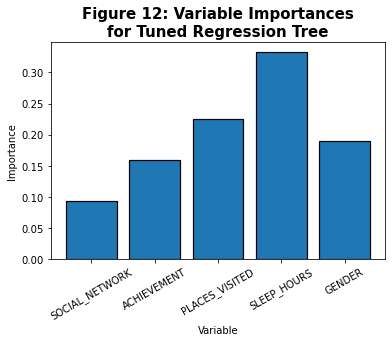

In [46]:
# Get numerical feature importances
importances = list(rf2.feature_importances_)
feature_importances_df['Tuned Random Forest'] = importances
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_cols, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
for pair in feature_importances:
    print('Variable: {:20} Importance: {}'.format(*pair)) 


# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', edgecolor = 'k', linewidth = 1.2)
# Tick labels for x axis
plt.xticks(x_values, feature_cols, rotation=30)
# Axis labels and title
plt.ylabel('Importance')
plt.xlabel('Variable')
plt.title('Figure 12: Variable Importances\nfor Tuned Regression Tree', fontweight = 'bold', fontsize = 15)


Text(0.5, 1.0, 'Figure 13: Cumulative Importances')

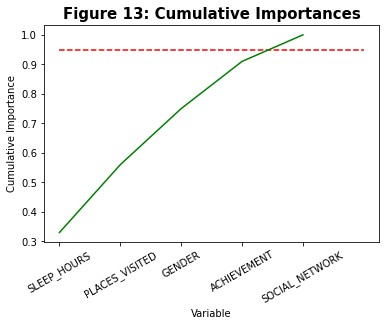

In [47]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]
# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)
# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')
# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')
# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 30)
# Axis labels and title
plt.xlabel('Variable')
plt.ylabel('Cumulative Importance')
plt.title('Figure 13: Cumulative Importances', fontweight ='bold', fontsize=15)



In [48]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = rf2.estimators_[5]
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = rf2.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'rf.dot', feature_names = feature_cols, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('rf.dot')
# Write graph to a png file
graph.write_png('RF.png')



## Oridinal Logistic Regression - GLM 

In [49]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# instantiate the model (using the default parameters)
logreg = LogisticRegression(solver='lbfgs', max_iter=1000 )

# fit the model with data
logreg.fit(X_train,y_train)

#
y_pred7 = logreg.predict(X_test)


mae = metrics.mean_absolute_error(y_test, y_pred7)
mse = metrics.mean_squared_error(y_test, y_pred7)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred7))
print('Mean Absolute Error: %.3f' % (mae))
print('Mean Squared Error: %.3f' % (mse))
print('Root Mean Squared Error: %.3f' % (rmse))

# rounding values in y_pred into the nearest int
round_y_pred7 = np.array([round(x) for x in y_pred7])
accuracy = 100 * metrics.accuracy_score(y_test, round_y_pred7)
print("Accuracy for OLR: %.3f" % (accuracy))

model_evaluation['OLR'] = [mae, mse, rmse, accuracy]


Mean Absolute Error: 1.079
Mean Squared Error: 1.951
Root Mean Squared Error: 1.397
Accuracy for OLR: 28.795


#### Feature Importances

Variable: GENDER               Importance: 0.68
Variable: SLEEP_HOURS          Importance: 0.27
Variable: PLACES_VISITED       Importance: 0.05
Variable: ACHIEVEMENT          Importance: 0.04
Variable: SOCIAL_NETWORK       Importance: -0.04


Text(0.5, 1.0, 'Figure 14: Variable Importances For Prediction Using OLR')

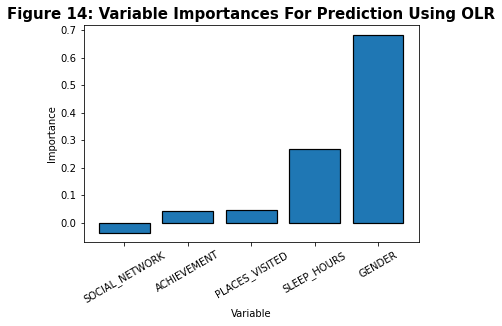

In [50]:
# Get numerical feature importances
importances = list(logreg.coef_[0])
feature_importances_df['OLR'] = importances
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_cols, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
for pair in feature_importances:
    print('Variable: {:20} Importance: {}'.format(*pair)) 

# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', edgecolor = 'k', linewidth = 1.2)
# Tick labels for x axis
plt.xticks(x_values, feature_cols, rotation=30)
# Axis labels and title
plt.ylabel('Importance')
plt.xlabel('Variable')
plt.title('Figure 14: Variable Importances For Prediction Using OLR', fontweight = 'bold', fontsize = 15)



# Model Comparison

In [223]:
model_df = pd.DataFrame(model_evaluation, index=['MAE', 'MSE', 'RMSE', 'Accuracy'])
model_df


,Full Regression Tree,Tuned Regression Tree,Bagging,Tuned Bagging,Random Forest,Tuned Random Forest,OLR
MAE,1.237128,1.093666,1.087067,1.084310,1.142055,1.078682,1.079499
MSE,2.555158,1.749355,1.742072,1.734353,2.037714,1.715805,1.950861
RMSE,1.598486,1.322632,1.319876,1.316948,1.427485,1.309887,1.396732
Accuracy,27.480438,28.450704,28.450704,28.200313,28.262911,28.325509,28.794992


<ipython-input-274-f39becfed8f9>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(model_df.columns, rotation=90, ha='right')
<ipython-input-274-f39becfed8f9>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(model_df.columns, rotation=90, ha='right')
<ipython-input-274-f39becfed8f9>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax3.set_xticklabels(model_df.columns, rotation=90, ha='right')


Text(0.5, 1.0, 'Model Comparison by RMSE')

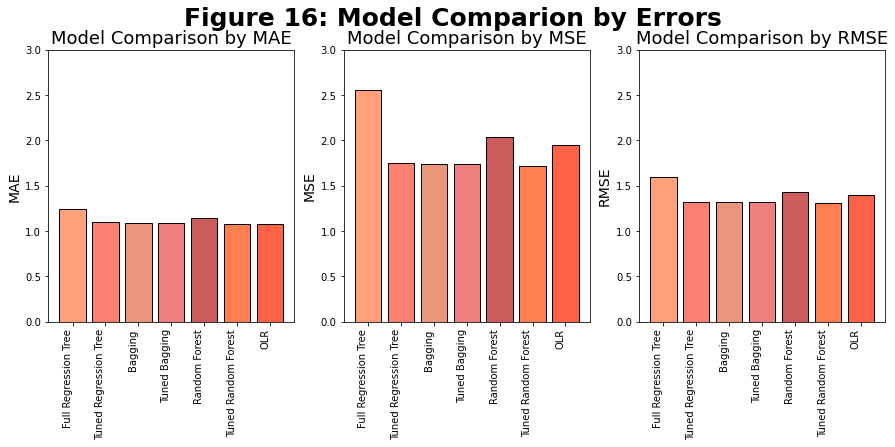

In [274]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize = (15,5), sharex = True)
fig.suptitle('Figure 16: Model Comparion by Errors', fontweight = 'bold', fontsize = 25, y=1)


ax1.bar(model_df.columns, model_df.loc['MAE'], color = ['#FFA07A', '#FA8072', '#E9967A', '#F08080', '#CD5C5C', '#FF7F50', '#FF6347'], edgecolor = 'k')
ax1.set_ylim(top = 3)
ax1.set_xticklabels(model_df.columns, rotation=90, ha='right')
ax1.set_ylabel('MAE', fontsize = 14); 
ax1.set_title('Model Comparison by MAE', fontsize = 18)

ax2.bar(model_df.columns, model_df.loc['MSE'], color = ['#FFA07A', '#FA8072', '#E9967A', '#F08080', '#CD5C5C', '#FF7F50', '#FF6347'], edgecolor = 'k')
ax2.set_ylim(top = 3)
ax2.set_xticklabels(model_df.columns, rotation=90, ha='right')
ax2.set_ylabel('MSE', fontsize = 14); 
ax2.set_title('Model Comparison by MSE', fontsize = 18)

ax3.bar(model_df.columns, model_df.loc['RMSE'], color = ['#FFA07A', '#FA8072', '#E9967A', '#F08080', '#CD5C5C', '#FF7F50', '#FF6347'], edgecolor = 'k')
ax3.set_xticklabels(model_df.columns, rotation=90, ha='right')
ax3.set_ylim(top = 3)
ax3.set_ylabel('RMSE', fontsize = 14); 
ax3.set_title('Model Comparison by RMSE', fontsize = 18)




Text(0.5, 1.0, 'Figure 16: Model Comparison by Accuracy')

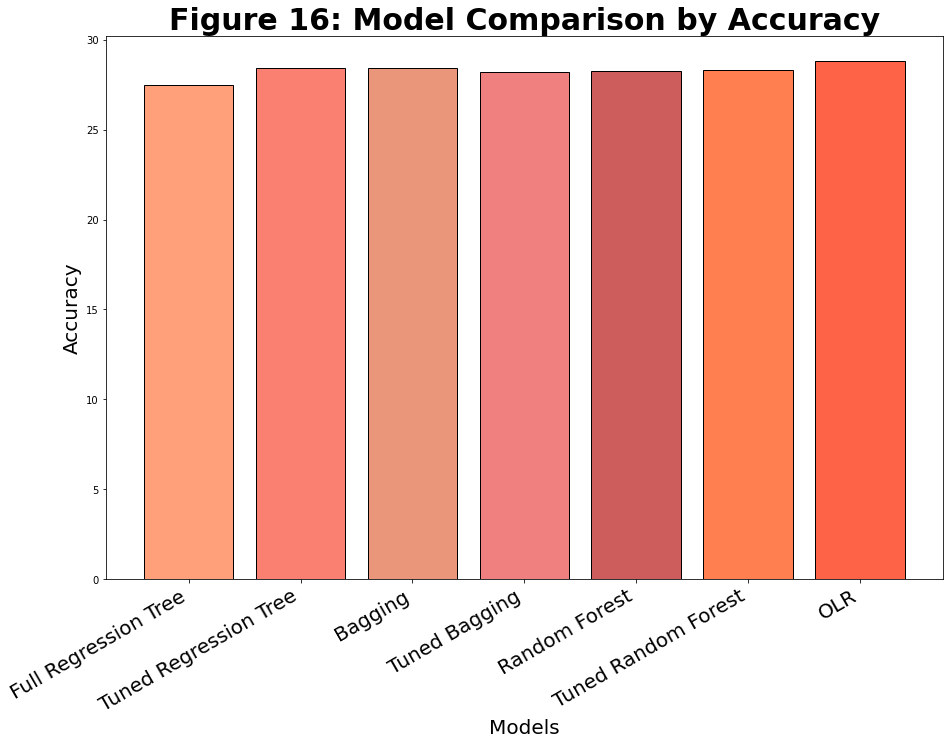

In [275]:

fig, ax = plt.subplots(figsize = (15,10))

ax.bar(model_df.columns, model_df.loc['Accuracy'], color = ['#FFA07A', '#FA8072', '#E9967A', '#F08080', '#CD5C5C', '#FF7F50', '#FF6347'], edgecolor = 'k')
# ax.set_ylim(top = 3)
# ax.set_xlabel(rotation=30)
plt.xticks(rotation=30, ha='right', fontsize = 20)
ax.set_ylabel('Accuracy', fontsize = 20); 
ax.set_xlabel('Models', fontsize = 20); 
ax.set_title('Figure 16: Model Comparison by Accuracy', fontsize = 30, fontweight = 'bold')


In [57]:
feature_importances_df = pd.DataFrame(feature_importances_df, index=feature_cols)
display(feature_importances_df)



,Pruned Regression Tree,Tuned Random Forest,OLR
SOCIAL_NETWORK,0.000000,0.093071,-0.036404
ACHIEVEMENT,0.000000,0.158899,0.040137
PLACES_VISITED,0.163379,0.225658,0.046259
SLEEP_HOURS,0.527870,0.332366,0.267585
GENDER,0.308751,0.190005,0.682456


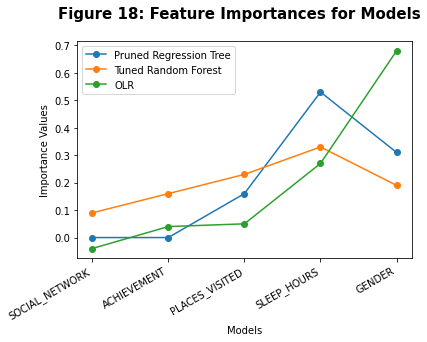

In [80]:
x = [0, 1, 2, 3, 4]
prt = [round(v, 2) for v in feature_importances_df['Pruned Regression Tree']]
trf = [round(v, 2) for v in feature_importances_df['Tuned Random Forest']]
olr = [round(v, 2) for v in feature_importances_df['OLR']]

# visualizing changes in parameters
plt.plot(x, prt, label = 'Pruned Regression Tree', marker='o')
plt.plot(x, trf, label = 'Tuned Random Forest', marker='o')
plt.plot(x, olr, label = 'OLR', marker='o')
plt.xlabel('Models')
plt.ylabel('Importance Values')
plt.xticks(x, feature_cols)
plt.xticks(rotation=30, ha='right', fontsize = 10)

plt.suptitle('Figure 18: Feature Importances for Models', fontweight = 'bold', fontsize = 15, y = 1)
plt.legend() 


